In [2]:
import numpy as np
import pandas as pd
import datetime as dt
from datetime import timedelta
import matplotlib.pyplot as plt
%matplotlib inline
import squarify

In [3]:
df = pd.read_csv(r'../data/transactions.csv')
df.head()

,customer_id,trans_date,trans_amount
0,CS5295,11-Feb-18,35
1,CS4768,15-Mar-20,39
2,CS2122,26-Feb-18,52
3,CS1217,16-Nov-16,99
4,CS1850,20-Nov-18,78


In [4]:
df.shape

(125000, 3)

In [5]:
df.customer_id.value_counts()

CS4424    39
CS4320    38
CS3799    36
CS5109    35
CS2620    35
          ..
CS8376     4
CS7224     4
CS8559     4
CS8504     4
CS7333     4
Name: customer_id, Length: 6889, dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125000 entries, 0 to 124999
Data columns (total 3 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   customer_id   125000 non-null  object
 1   trans_date    125000 non-null  object
 2   trans_amount  125000 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 2.9+ MB


In [7]:
df['trans_date'] = df['trans_date'].replace(['29-Feb-17'],'')
df

,customer_id,trans_date,trans_amount
0,CS5295,11-Feb-18,35
1,CS4768,15-Mar-20,39
2,CS2122,26-Feb-18,52
3,CS1217,16-Nov-16,99
4,CS1850,20-Nov-18,78
...,...,...,...
124995,CS8433,26-Jun-16,64
124996,CS7232,19-Aug-19,38
124997,CS8731,28-Nov-19,42
124998,CS8133,14-Dec-18,13


In [8]:
df['trans_date'] = pd.to_datetime(df['trans_date'])
df

,customer_id,trans_date,trans_amount
0,CS5295,2018-02-11,35
1,CS4768,2020-03-15,39
2,CS2122,2018-02-26,52
3,CS1217,2016-11-16,99
4,CS1850,2018-11-20,78
...,...,...,...
124995,CS8433,2016-06-26,64
124996,CS7232,2019-08-19,38
124997,CS8731,2019-11-28,42
124998,CS8133,2018-12-14,13


In [9]:
print('{:,} transactions don\'t have a customer id'
      .format(df[df.customer_id.isnull()].shape[0]))

print('Transactions timeframe from {} to {}'.format(df['trans_date'].min(),df['trans_date'].max()))

print('{:,} transactions don\'t have a trans_date'
      .format(df[df.trans_date.isnull()].shape[0]))

print('{:,} transactions don\'t have a trans_amount'
      .format(df[df.trans_amount.isnull()].shape[0]))      

0 transactions don't have a customer id
Transactions timeframe from 2016-05-16 00:00:00 to 2020-03-16 00:00:00
90 transactions don't have a trans_date
0 transactions don't have a trans_amount


In [10]:
null_date = pd.isnull(df["trans_date"])
df_clean = df[~null_date]
df_clean

,customer_id,trans_date,trans_amount
0,CS5295,2018-02-11,35
1,CS4768,2020-03-15,39
2,CS2122,2018-02-26,52
3,CS1217,2016-11-16,99
4,CS1850,2018-11-20,78
...,...,...,...
124995,CS8433,2016-06-26,64
124996,CS7232,2019-08-19,38
124997,CS8731,2019-11-28,42
124998,CS8133,2018-12-14,13


In [11]:
data_process = df_clean.groupby(['customer_id']).agg({
        'trans_date': lambda x: (dt.datetime.today() - x.max()).days,
        'trans_amount': ['count', 'sum']})

data_process.reset_index(inplace=True)

data_process.rename(columns={'':'customer_id',
                         '<lambda>': 'Recency',
                         'count': 'Frequency',
                         'sum': 'MonetaryValue'}, inplace=True)

data_process = data_process.droplevel(0, axis=1)

In [12]:
data_process

,customer_id,Recency,Frequency,MonetaryValue
0,CS1112,582,15,1012
1,CS1113,556,20,1490
2,CS1114,553,19,1432
3,CS1115,531,22,1659
4,CS1116,724,13,857
...,...,...,...,...
6884,CS8996,618,13,582
6885,CS8997,782,14,543
6886,CS8998,605,13,624
6887,CS8999,778,12,383


In [13]:
data_process.describe()

,Recency,Frequency,MonetaryValue
count,6889.000000,6889.000000,6889.000000
mean,601.349252,18.131804,1178.404993
std,85.545443,5.192020,465.605801
min,520.000000,4.000000,149.000000
25%,543.000000,14.000000,781.000000
50%,574.000000,18.000000,1227.000000
75%,632.000000,22.000000,1520.000000
max,1378.000000,39.000000,2933.000000


In [14]:
import seaborn as sns 

C:\Users\galihputrala\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\galihputrala\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\galihputrala\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `h

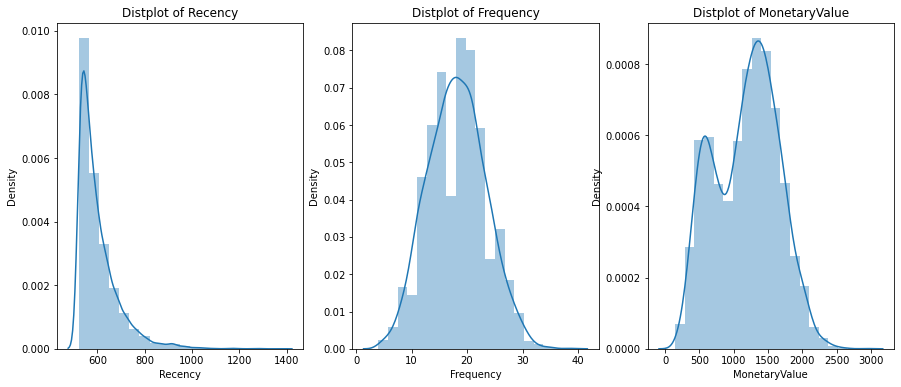

In [15]:
plt.figure(1 , figsize = (15 , 6))
n = 0 
for x in ['Recency' , 'Frequency' , 'MonetaryValue']:
    n += 1
    plt.subplot(1 , 3 , n)
    sns.distplot(data_process[x] , bins = 20)
    plt.title('Distplot of {}'.format(x))
plt.show()

C:\Users\galihputrala\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\galihputrala\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\galihputrala\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


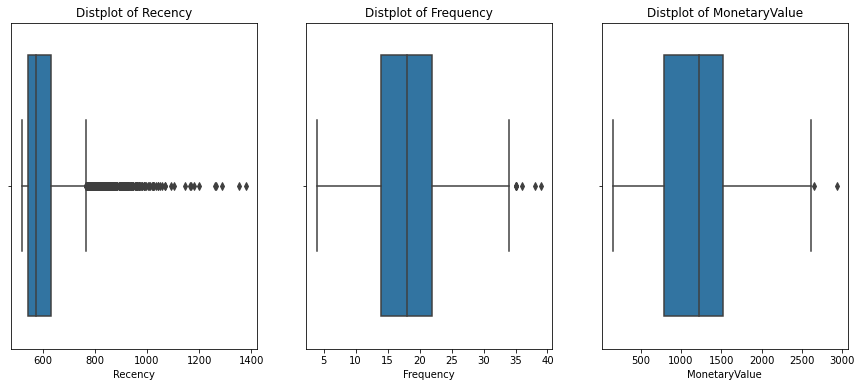

In [16]:
plt.figure(1 , figsize = (15 , 6))
n = 0 
for x in ['Recency' , 'Frequency' , 'MonetaryValue']:
    n += 1
    plt.subplot(1 , 3 , n)
    sns.boxplot(data_process[x])
    plt.title('Distplot of {}'.format(x))
plt.show()

# Standardized Variable

In [17]:
from sklearn.preprocessing import StandardScaler
X = data_process.drop(['customer_id'], axis=1)

standardize = StandardScaler()
X_std = pd.DataFrame(standardize.fit_transform(X))
X_std.columns = X.columns

In [18]:
X_std

,Recency,Frequency,MonetaryValue
0,-0.226203,-0.603240,-0.357421
1,-0.530157,0.359847,0.669274
2,-0.565229,0.167229,0.544696
3,-0.822421,0.745081,1.032268
4,1.433854,-0.988474,-0.690344
...,...,...,...
6884,0.194656,-0.988474,-1.281016
6885,2.111905,-0.795857,-1.364784
6886,0.042679,-0.988474,-1.190804
6887,2.065143,-1.181091,-1.708447


# K-Means

In [19]:
X_ = X_std[['Recency' , 'Frequency', 'MonetaryValue']].values

In [20]:
def k_means_inertia_silhouette(X, k_max = 10, init = 'k-means++'):
    inertia = []
    silhouette = []
    for k in range(2, k_max):
        km =  KMeans(init = init, n_clusters = k, random_state= 42)
        km.fit(X)
        inertia.append(km.inertia_)
        silhouette.append(silhouette_score(X, km.labels_))
    
    plt.figure(1 , figsize = (15 ,6))
    plt.plot(np.arange(2 , k_max) , inertia , 'o')
    plt.plot(np.arange(2 , k_max) , inertia , '-' , alpha = 0.5)
    plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
    plt.title('The Elbow method using Inertia for each number of cluster')
    plt.show()

    plt.figure(1 , figsize = (15 ,6))
    plt.plot(np.arange(2 , k_max) , silhouette , 'o')
    plt.plot(np.arange(2 , k_max) , silhouette , '-' , alpha = 0.5)
    plt.xlabel('Number of Clusters') , plt.ylabel('Silhouette')
    plt.title('Silhouette score for each number of cluster')
    plt.show()
    
    return inertia, silhouette

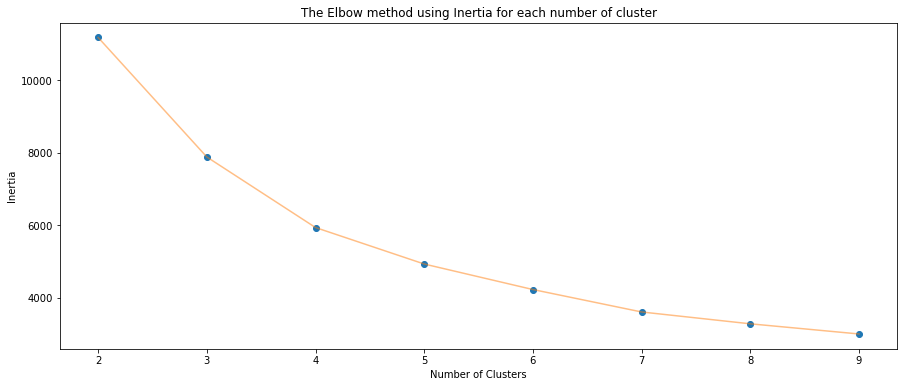

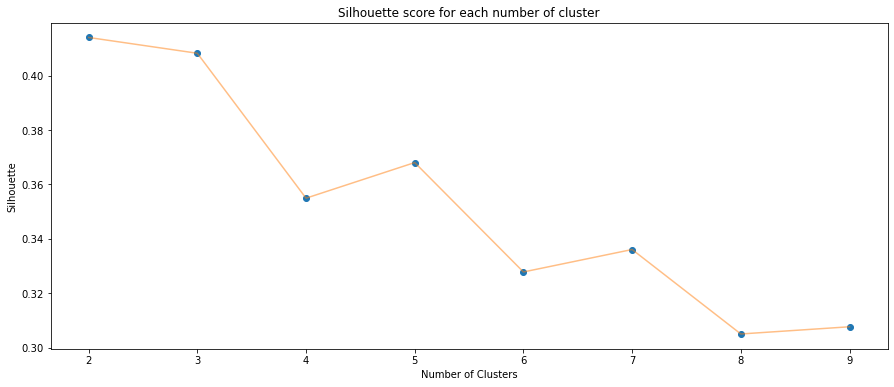

In [21]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
inertia, silhouette = k_means_inertia_silhouette(X_, k_max = 10, init = 'k-means++')

Coba 2 jumlah K

- Menggunakan K=2 (Karena silhouette_score paling tinggi)
- Menggunakan K=5 (Karena elbow method & di K=5 silhouette_score naik ke atas)

In [22]:
k = 2
k_means = KMeans(init = "k-means++", n_clusters = k, random_state= 42)
k_means.fit(X_)

KMeans(n_clusters=2, random_state=42)

In [23]:
Segment = k_means.labels_
X.groupby(Segment, as_index=False).mean()

,Recency,Frequency,MonetaryValue
0,576.304452,21.837377,1525.905092
1,631.286488,13.702358,763.021670


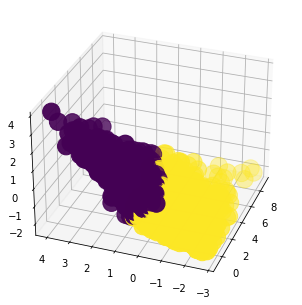

In [24]:
#simple visualization

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X_[:,0], X_[:,1], X_[:,2], c=Segment, s=300)
ax.view_init(azim=200)
plt.show()

In [25]:
k = 5
k_means5 = KMeans(init = "k-means++", n_clusters = k, random_state= 42)
k_means5.fit(X_)

KMeans(n_clusters=5, random_state=42)

In [26]:
Segment5 = k_means5.labels_
X.groupby(Segment5, as_index=False).mean()

,Recency,Frequency,MonetaryValue
0,828.710280,11.675234,604.750000
1,565.660000,24.904375,1761.518125
2,682.480465,18.794087,1280.673706
3,558.265696,18.486351,1249.568699
4,588.329837,12.607809,630.198135


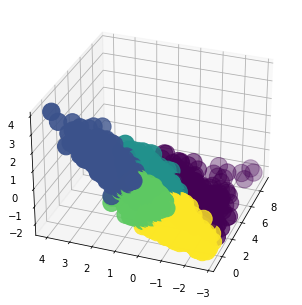

In [74]:
#simple visualization

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X_[:,0], X_[:,1], X_[:,2], c=Segment5, s=300)
ax.view_init(azim=200)
plt.show()

In [28]:
data_process['label_kmeans2'] = Segment
data_process['label_kmeans5'] = Segment5
data_process

,customer_id,Recency,Frequency,MonetaryValue,label_kmeans2,label_kmeans5
0,CS1112,582,15,1012,1,3
1,CS1113,556,20,1490,0,3
2,CS1114,553,19,1432,0,3
3,CS1115,531,22,1659,0,1
4,CS1116,724,13,857,1,0
...,...,...,...,...,...,...
6884,CS8996,618,13,582,1,4
6885,CS8997,782,14,543,1,0
6886,CS8998,605,13,624,1,4
6887,CS8999,778,12,383,1,0


# DBSCAN

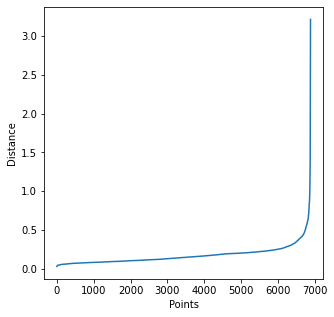

In [29]:
from sklearn.neighbors import NearestNeighbors
nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(X_)
distances, indices = neighbors.kneighbors(X_)
distances = np.sort(distances[:,10], axis=0)
fig = plt.figure(figsize=(5, 5))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("Distance")
plt.savefig("Distance_curve.png", dpi=300)

0.26596504372898383


<Figure size 360x360 with 0 Axes>

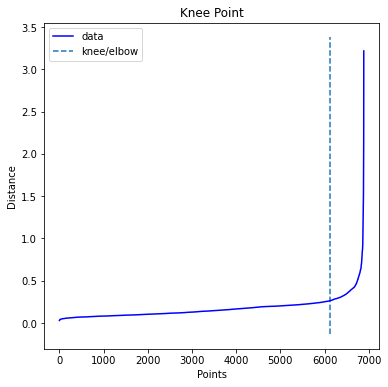

In [30]:
#Untuk mencari eps

from kneed import KneeLocator
i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')
fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")

print(distances[knee.knee])

In [31]:
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.26, min_samples=6).fit(X_)

#If your data has more than 2 dimensions, choose MinPts = 2*dim,
#where dim= the dimensions of your data set (Sander et al., 1998)

In [32]:
# Number of clusters in labels, ignoring noise if present.
# the label -1 is considered as noise by the DBSCAN algorithm

labels = db.labels_ 
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0) 
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 4
Estimated number of noise points: 241


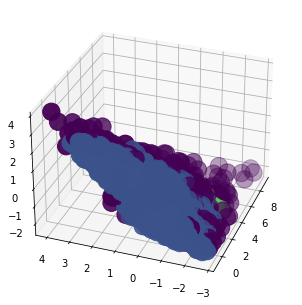

In [33]:
#simple visualization

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X_[:,0], X_[:,1], X_[:,2], c=labels, s=300)
ax.view_init(azim=200)
plt.show()

In [34]:
X.groupby(labels).mean()

,Recency,Frequency,MonetaryValue
-1,818.850622,16.427386,995.618257
0,591.957691,18.230281,1188.412965
1,916.000000,10.937500,486.937500
2,907.500000,7.166667,319.000000
3,959.375000,10.625000,433.250000


In [35]:
data_process['db_label'] = labels

In [36]:
data_process

,customer_id,Recency,Frequency,MonetaryValue,label_kmeans2,label_kmeans5,db_label
0,CS1112,582,15,1012,1,3,0
1,CS1113,556,20,1490,0,3,0
2,CS1114,553,19,1432,0,3,0
3,CS1115,531,22,1659,0,1,0
4,CS1116,724,13,857,1,0,0
...,...,...,...,...,...,...,...
6884,CS8996,618,13,582,1,4,0
6885,CS8997,782,14,543,1,0,0
6886,CS8998,605,13,624,1,4,0
6887,CS8999,778,12,383,1,0,0


# Hierarchical Clustering: Agglomerative

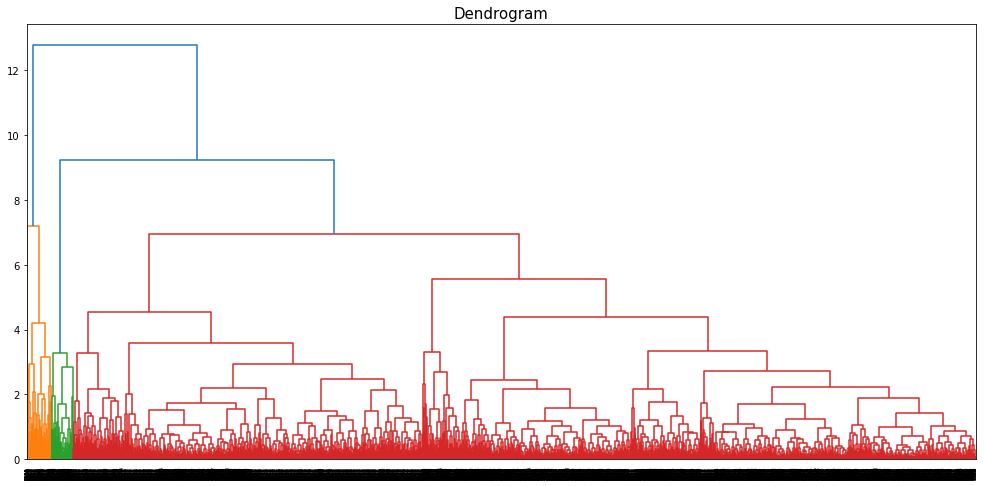

In [37]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
plt.figure(figsize = (17, 8))

dendo = dendrogram(linkage(X_, method = 'complete'))
plt.title('Dendrogram', fontsize = 15)
plt.show()

In [38]:
agglo_cluster = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'complete')
Segment_agglo = agglo_cluster.fit_predict(X)
Segment_agglo

array([0, 1, 1, ..., 0, 0, 0], dtype=int64)

In [39]:
X.groupby(Segment_agglo, as_index=False).mean()

,Recency,Frequency,MonetaryValue
0,617.380927,14.418912,825.659483
1,582.637063,22.297852,1577.023726
2,581.586207,31.724138,2318.051724


In [40]:
data_process['agglo_label'] = Segment_agglo
data_process

,customer_id,Recency,Frequency,MonetaryValue,label_kmeans2,label_kmeans5,db_label,agglo_label
0,CS1112,582,15,1012,1,3,0,0
1,CS1113,556,20,1490,0,3,0,1
2,CS1114,553,19,1432,0,3,0,1
3,CS1115,531,22,1659,0,1,0,1
4,CS1116,724,13,857,1,0,0,0
...,...,...,...,...,...,...,...,...
6884,CS8996,618,13,582,1,4,0,0
6885,CS8997,782,14,543,1,0,0,0
6886,CS8998,605,13,624,1,4,0,0
6887,CS8999,778,12,383,1,0,0,0


# 3D Interactive Viz to Know The Labels Better

In [42]:


import plotly.express as px
X['Segment_agglo'] = list(map(str, Segment_agglo))
fig = px.scatter_3d(X, x='Recency', y='Frequency', z='MonetaryValue', color='Segment_agglo',
                   opacity = 0.8, height=800,
                   title="Hierarchical Clustering: Agglomerative")
fig.show()

In [43]:
import plotly.express as px
X['Segment'] = list(map(str, Segment))
fig = px.scatter_3d(X, x='Recency', y='Frequency', z='MonetaryValue', color='Segment',
                   opacity = 0.8, height=800, title="K-Means (2K)")
fig.show()

In [72]:
import plotly.express as px
X['Segment5'] = list(map(str, Segment5))
fig = px.scatter_3d(X, x='Recency', y='Frequency', z='MonetaryValue', color='Segment5',
                   opacity = 0.8, height=800, title="K-Means (5K)")
fig.show()

In [45]:
import plotly.express as px
X['labels'] = list(map(str, labels))
fig = px.scatter_3d(X, x='Recency', y='Frequency', z='MonetaryValue', color='labels',
                   opacity = 0.8, height=800, title="DBSCAN")
fig.show()

# Summary

In [77]:
data_process.describe()

,Recency,Frequency,MonetaryValue,label_kmeans2,label_kmeans5,db_label,agglo_label
count,6889.000000,6889.000000,6889.000000,6889.000000,6889.000000,6889.000000,6889.000000
mean,601.349252,18.131804,1178.404993,0.455509,2.460735,-0.027435,0.469589
std,85.545443,5.192020,465.605801,0.498053,1.258630,0.224713,0.515706
min,520.000000,4.000000,149.000000,0.000000,0.000000,-1.000000,0.000000
25%,543.000000,14.000000,781.000000,0.000000,1.000000,0.000000,0.000000
50%,574.000000,18.000000,1227.000000,0.000000,3.000000,0.000000,0.000000
75%,632.000000,22.000000,1520.000000,1.000000,3.000000,0.000000,1.000000
max,1378.000000,39.000000,2933.000000,1.000000,4.000000,3.000000,2.000000


Dilihat dari visualisasi hasil customer clustering, algoritma yang paling dapat menggambarkan data adalah K-Means, dengan jumlah K=5.

Berdasarkan metode ini, pelanggan terbagi ke 5 cluster, dengan tingkat Recency, Frequency, dam Monetary yang berbeda beda. Cluster tersebut antara lain :

In [48]:
data_process.groupby(['label_kmeans5'], as_index=False).agg({'Recency':'mean', 'Frequency':'mean','MonetaryValue':'mean','customer_id':'count'})

,label_kmeans5,Recency,Frequency,MonetaryValue,customer_id
0,0,828.710280,11.675234,604.750000,428
1,1,565.660000,24.904375,1761.518125,1600
2,2,682.480465,18.794087,1280.673706,947
3,3,558.265696,18.486351,1249.568699,2198
4,4,588.329837,12.607809,630.198135,1716


Jumlah orang dalam data : 6889 Orang

Data Recency :
* Rata-rata : 601 Hari (1,6 Tahun)
* Terkecil : 520 Hari (1,4 Tahun)
* Terbesar : 1378 Hari (3,8 Tahun)

Data Frequency :
* Rata-rata : 18 kali transaksi
* Terkecil : 4 kali transaksi
* Terbesar : 39 kali transaksi

Data Monetary :
* Rata-rata : 1178
* Terkecil : 149
* Terbesar : 2933

___

Clustering :

1. Cluster 0 : Pelanggan yang sudah lama tidak belanja dan hanya sedikit bertransaksi (baik dari frequency ataupuin nominal)
* Jumlah : 428 Orang
* Rata-rata pembelian terakhir : 829 Hari (+/- 2,3 Tahun)
* Rata-rata frequency pembelian : 12 kali
* Rata-rata nominal pembelian : 605

2. Cluster 1 : Pelanggan yang cukup royal bertransaksi (besar baik dalam frequency maupun nominal), dan transakisi terakhir tidak terlalu lama dari hari ini
* Jumlah : 1.600 Orang
* Rata-rata pembelian terakhir : 566 Hari (+/- 1,5 Tahun)
* Rata-rata frequency pembelian : 25 kali
* Rata-rata nominal pembelian : 1762

3. Cluster 2 : Pelanggan yang cukup lama sudah tidak bertransaksi namun cukup royal 
* Jumlah : 947 Orang
* Rata-rata pembelian terakhir : 682 Hari (+/- 1,9 Tahun)
* Rata-rata frequency pembelian : 19 kali
* Rata-rata nominal pembelian : 1280

4. Cluster 3 : Pelanggan yang transasksi terakhirnya tidak terlalu lama dari hari ini dan cukup royal 
* Jumlah : 2.198 Orang
* Rata-rata pembelian terakhir : 558 Hari (+/- 1,6 Tahun)
* Rata-rata frequency pembelian : 19 kali
* Rata-rata nominal pembelian : 1250

5. Cluster 4 : Pelanggan yang transasksi terakhirnya tidak terlalu lama dari hari ini namun sedikit bertransksi (baik dari frequency atupun nominal)
* Jumlah : 1.716 Orang
* Rata-rata pembelian terakhir : 588 Hari (+/- 1,5 Tahun)
* Rata-rata frequency pembelian : 13 kali
* Rata-rata nominal pembelian : 630

___

Rekomendasi :

1. Cluster 0 : 
* Tidak diprioritaskan untuk marketing, karena hanya sedikit bertransaksi dan sudah lama tidak bertransaksi

2. Cluster 1 : Pelanggan yang cukup royal bertransaksi (besar baik dalam frequency maupun nominal), dan transakisi terakhir tidak terlalu lama dari hari ini
* Dapat diberikan penawaran khusus/loyality program sehingga pelanggan dapat lagi bertransaksi dan menjaga nominal serta frequency nya
* Merupakan pelanggan yang paling banyak memberikan revenue bagi perusahaan. Pelanggan prioritas

3. Cluster 2 : Pelanggan yang cukup lama sudah tidak bertransaksi namun cukup royal 
* Dapat diapproach marketing program untuk mengajak pelanggan bertransaksi kembali

4. Cluster 3 : Pelanggan yang transasksi terakhirnya tidak terlalu lama dari hari ini dan cukup royal 
* Dapat diberikan penawaran khusus/loyality program sehingga pelanggan dapat lagi bertransaksi dan menjaga nominal serta frequency nya
* Mirip dengan cluster 1 namun merupakan tier pelanggan ke 2

5. Cluster 4 : Pelanggan yang transasksi terakhirnya tidak terlalu lama dari hari ini namun sedikit bertransksi (baik dari frequency atupun nominal)
* Dapat diberikan discount program sehingga pelanggan ini dapat meningkatkan transaksinya

___

Customer Tier :

Best --> Worst

Cluster 1 / Cluster 3 / Cluster 2 / Cluster 4 / Cluster 0

Kelas A / Kelas B / Kelas C / Kelas D / Kelas E

# Export Data

In [89]:
data_final = data_process.drop(['label_kmeans2','db_label', 'agglo_label'],axis=1)
data_final

,customer_id,Recency,Frequency,MonetaryValue,label_kmeans5
0,CS1112,582,15,1012,3
1,CS1113,556,20,1490,3
2,CS1114,553,19,1432,3
3,CS1115,531,22,1659,1
4,CS1116,724,13,857,0
...,...,...,...,...,...
6884,CS8996,618,13,582,4
6885,CS8997,782,14,543,0
6886,CS8998,605,13,624,4
6887,CS8999,778,12,383,0


In [90]:
data_final['label_kmeans5'].replace(to_replace =[0,1,2,3,4], 
                            value =['Kelas E', 'Kelas A', 'Kelas C', 'Kelas B', 'Kelas D'], inplace=True)

In [91]:
data_final

,customer_id,Recency,Frequency,MonetaryValue,label_kmeans5
0,CS1112,582,15,1012,Kelas B
1,CS1113,556,20,1490,Kelas B
2,CS1114,553,19,1432,Kelas B
3,CS1115,531,22,1659,Kelas A
4,CS1116,724,13,857,Kelas E
...,...,...,...,...,...
6884,CS8996,618,13,582,Kelas D
6885,CS8997,782,14,543,Kelas E
6886,CS8998,605,13,624,Kelas D
6887,CS8999,778,12,383,Kelas E


In [82]:
data_final.to_csv('data final.csv')
